NK cell example

|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | -743.4    | 69.65     | 28.61     |
| 2         | -672.4    | 22.69     | 55.13     |
| 3         | -440.8    | 71.95     | 42.31     |
| 4         | -2.553e+0 | 98.08     | 68.48     |
| 5         | -20.02    | 48.09     | 39.21     |
| 6         | -1.465e+0 | 27.61     | 17.39     |
| 7         | 24.67     | 51.64     | 58.52     |
| 8         | 8.44      | 52.84     | 59.14     |
| 9         | -4.798e+0 | 0.9334    | 99.9      |
| 10        | -4.728e+0 | 98.98     | 0.7173    |
| 11        | -2.609e+0 | 64.57     | 99.97     |
| 12        | -2.726e+0 | 0.03544   | 31.86     |
| 13        | 47.4      | 56.97     | 47.99     |
| 14        | -49.93    | 38.08     | 47.2      |
| 15        | 94.61     | 48.15     | 48.6      |
| 16        | -8.112    | 41.5      | 55.99     |
| 17        | 93.06     | 51.63     | 52.07     |
| 18        | 92.15     | 51.68     | 47.76     |


C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\3805006719.py:53: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\3805006719.py:53: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\3805006719.py:53: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing t

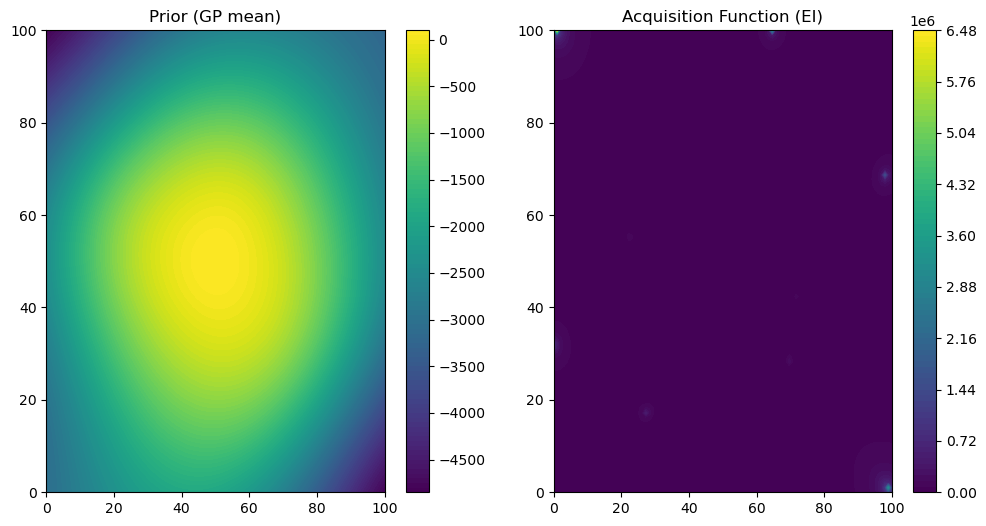

{'target': np.float64(99.95068053875556), 'params': {'cytokine_concentration': np.float64(50.21294074133131), 'growth_factor_concentration': np.float64(49.93694683254815)}}


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from bayes_opt import BayesianOptimization
from numpy.random import seed

# Define the objective function
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    # Replace this with your actual assay measurement
    cytotoxicity = -((cytokine_concentration - 50)**2 + (growth_factor_concentration - 50)**2) + 100
    return cytotoxicity

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),  # Example bounds
    'growth_factor_concentration': (0, 100)  # Example bounds
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=15,  # Number of iterations
)

# Visualize the prior and acquisition functions
def plot_prior_and_acquisition(optimizer):
    x = np.linspace(0, 100, 100).reshape(-1, 1)
    y = np.linspace(0, 100, 100).reshape(-1, 1)
    X, Y = np.meshgrid(x, y)
    Z = np.array([optimizer._gp.predict(np.array([[xi, yi]]), return_std=True)[0] for xi, yi in zip(np.ravel(X), np.ravel(Y))])
    Z = Z.reshape(X.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(X, Y, Z, levels=100)
    plt.colorbar()
    plt.title('Prior (GP mean)')

    # Manually compute the acquisition function values (EI)
    acquisition = np.zeros_like(Z)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            xi = np.array([[X[i, j], Y[i, j]]])
            mean, std = optimizer._gp.predict(xi, return_std=True)
            z = (mean - optimizer._space.target.max()) / std
            acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))

    plt.subplot(1, 2, 2)
    plt.contourf(X, Y, acquisition, levels=100)
    plt.colorbar()
    plt.title('Acquisition Function (EI)')
    plt.show()

plot_prior_and_acquisition(optimizer)

# Print the best result
print(optimizer.max)



Visualization example

In [14]:
import numpy as np
from bayes_opt import BayesianOptimization
from numpy.random import seed

# Define the objective function (replace with actual measurement logic)
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    cytotoxicity = -((cytokine_concentration - 50)**2 + (growth_factor_concentration - 50)**2) + 100
    return cytotoxicity

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=15,  # Number of iterations
)

# Print the best result
print(optimizer.max)


|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | -743.4    | 69.65     | 28.61     |
| 2         | -672.4    | 22.69     | 55.13     |
| 3         | -440.8    | 71.95     | 42.31     |
| 4         | -2.553e+0 | 98.08     | 68.48     |
| 5         | -20.02    | 48.09     | 39.21     |
| 6         | -1.465e+0 | 27.61     | 17.39     |
| 7         | 24.67     | 51.64     | 58.52     |
| 8         | 8.44      | 52.84     | 59.14     |
| 9         | -4.798e+0 | 0.9334    | 99.9      |
| 10        | -4.728e+0 | 98.98     | 0.7173    |
| 11        | -2.609e+0 | 64.57     | 99.97     |
| 12        | -2.726e+0 | 0.03544   | 31.86     |
| 13        | 47.4      | 56.97     | 47.99     |
| 14        | -49.93    | 38.08     | 47.2      |
| 15        | 94.61     | 48.15     | 48.6      |
| 16        | -8.112    | 41.5      | 55.99     |
| 17        | 93.06     | 51.63     | 52.07     |
| 18        | 92.15     | 51.68     | 47.76     |


{'target': np.float64(95.0), 'params': {'cytokine_concentration': np.float64(50.0), 'growth_factor_concentration': np.float64(60.0)}}


C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\4109052712.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\4109052712.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\4109052712.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing t

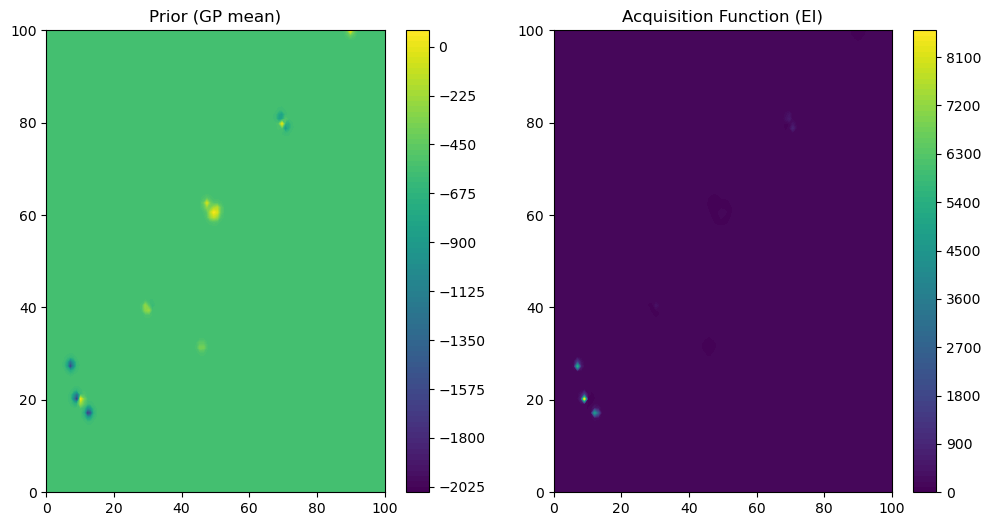

In [16]:
import numpy as np
from bayes_opt import BayesianOptimization
from numpy.random import seed

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=None,  # No initial function, we'll use data points
    pbounds=pbounds,
    random_state=123
)

# Collect initial data points (replace with actual experimental data)
initial_data = [
    {'params': {'cytokine_concentration': 10, 'growth_factor_concentration': 20}, 'target': 85},
    {'params': {'cytokine_concentration': 30, 'growth_factor_concentration': 40}, 'target': 90},
    {'params': {'cytokine_concentration': 50, 'growth_factor_concentration': 60}, 'target': 95},
    {'params': {'cytokine_concentration': 70, 'growth_factor_concentration': 80}, 'target': 80},
    {'params': {'cytokine_concentration': 90, 'growth_factor_concentration': 100}, 'target': 75}
]

# Add initial data points to the optimizer
for data in initial_data:
    optimizer.register(params=data['params'], target=data['target'])

# Define a function to simulate new measurements (replace with actual logic)
def measure_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    # Simulate new measurement (for demonstration purposes)
    cytotoxicity = -((cytokine_concentration - 50)**2 + (growth_factor_concentration - 50)**2) + 100
    return cytotoxicity

# Run the optimization
for _ in range(15):  # Number of iterations
    next_point = optimizer.suggest()
    target = measure_cytotoxicity(**next_point)  # Replace with actual measurement
    optimizer.register(params=next_point, target=target)

# Print the best result
print(optimizer.max)

# Visualize the prior and acquisition functions
def plot_prior_and_acquisition(optimizer):
    x = np.linspace(0, 100, 100).reshape(-1, 1)
    y = np.linspace(0, 100, 100).reshape(-1, 1)
    X, Y = np.meshgrid(x, y)
    Z = np.array([optimizer._gp.predict(np.array([[xi, yi]]), return_std=True)[0] for xi, yi in zip(np.ravel(X), np.ravel(Y))])
    Z = Z.reshape(X.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(X, Y, Z, levels=100)
    plt.colorbar()
    plt.title('Prior (GP mean)')

    # Manually compute the acquisition function values (EI)
    acquisition = np.zeros_like(Z)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            xi = np.array([[X[i, j], Y[i, j]]])
            mean, std = optimizer._gp.predict(xi, return_std=True)
            z = (mean - optimizer._space.target.max()) / std
            acquisition[i, j] = std * (z * (1 + z) + np.exp(-0.5 * z**2) / np.sqrt(2 * np.pi))

    plt.subplot(1, 2, 2)
    plt.contourf(X, Y, acquisition, levels=100)
    plt.colorbar()
    plt.title('Acquisition Function (EI)')
    plt.show()

plot_prior_and_acquisition(optimizer)



In [23]:

import numpy as np
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'cytokine_concentration': 10, 'growth_factor_concentration': 20, 'cytotoxicity': 85},
    {'cytokine_concentration': 30, 'growth_factor_concentration': 40, 'cytotoxicity': 90},
    {'cytokine_concentration': 50, 'growth_factor_concentration': 60, 'cytotoxicity': 95},
    {'cytokine_concentration': 70, 'growth_factor_concentration': 80, 'cytotoxicity': 80},
    {'cytokine_concentration': 90, 'growth_factor_concentration': 100, 'cytotoxicity': 75}
]

# Extracting data
X = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Polynomial regression
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Objective function based on the fitted model
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=15,  # Number of iterations
)

# Print the best result
print(optimizer.max)



|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | -67.41    | 69.65     | 28.61     |
| 2         | 145.7     | 22.69     | 55.13     |
| 3         | -52.62    | 71.95     | 42.31     |
| 4         | -127.2    | 98.08     | 68.48     |
| 5         | 39.63     | 48.09     | 39.21     |
| 6         | 363.4     | 0.2538    | 99.11     |
| 7         | 341.9     | 24.5      | 99.88     |
| 8         | 362.4     | 1.455     | 99.0      |
| 9         | 367.8     | 0.9334    | 99.9      |
| 10        | 366.6     | 4.636     | 99.96     |
| 11        | 367.0     | 3.72      | 99.96     |
| 12        | 367.6     | 2.465     | 99.95     |
| 13        | 367.6     | 1.064     | 99.87     |
| 14        | 364.2     | 5.257     | 99.61     |
| 15        | 367.5     | 1.283     | 99.87     |
| 16        | 366.4     | 2.011     | 99.73     |
| 17        | 367.0     | 1.294     | 99.78     |
| 18        | 365.7     | 4.993     | 99.84     |


In [24]:
# Add new data points and update the model
new_data_points = [
    {'cytokine_concentration': 25, 'growth_factor_concentration': 35, 'cytotoxicity': 88},
    {'cytokine_concentration': 55, 'growth_factor_concentration': 65, 'cytotoxicity': 92}
]

# Update the model with new data points
for data in new_data_points:
    optimizer.register(params={'cytokine_concentration': data['cytokine_concentration'], 'growth_factor_concentration': data['growth_factor_concentration']}, target=data['cytotoxicity'])

# Re-run the optimization with updated data
optimizer.maximize(
    init_points=0,  # No additional random points
    n_iter=10,  # Number of iterations
)

# Print the updated best result
print(optimizer.max)

| 21        | 88.0      | 25.0      | 35.0      |
| 22        | 92.0      | 55.0      | 65.0      |
|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 23        | 368.2     | 1.167     | 99.98     |
| 24        | 364.5     | 7.099     | 99.87     |
| 25        | 366.9     | 3.778     | 99.95     |
| 26        | 367.7     | 2.669     | 99.98     |
| 27        | 366.1     | 3.397     | 99.78     |
| 28        | 367.4     | 2.862     | 99.96     |
| 29        | 367.8     | 0.1951    | 99.87     |
| 30        | 366.8     | 0.9957    | 99.74     |
| 31        | 365.0     | 3.622     | 99.6      |
| 32        | 367.6     | 2.267     | 99.94     |
{'target': np.float64(368.381211707398), 'params': {'cytokine_concentration': np.float64(0.29019480222775007), 'growth_factor_concentration': np.float64(99.96912964927847)}}


In [29]:
import numpy as np
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'cytokine_concentration': 10, 'growth_factor_concentration': 20, 'cytotoxicity': 85},
    {'cytokine_concentration': 30, 'growth_factor_concentration': 40, 'cytotoxicity': 90},
    {'cytokine_concentration': 50, 'growth_factor_concentration': 60, 'cytotoxicity': 95},
    {'cytokine_concentration': 70, 'growth_factor_concentration': 80, 'cytotoxicity': 80},
    {'cytokine_concentration': 90, 'growth_factor_concentration': 100, 'cytotoxicity': 50}
]

# Extracting data
X = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Polynomial regression
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Objective function based on the fitted model
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=10,  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Add new data points and update the model
new_data_points = [
    {'cytokine_concentration': 25, 'growth_factor_concentration': 35, 'cytotoxicity': 88},
    {'cytokine_concentration': 55, 'growth_factor_concentration': 65, 'cytotoxicity': 92}
]

# Combine old and new data points
all_data_points = data_points + new_data_points

# Extracting combined data
X_combined = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in all_data_points])
y_combined = np.array([dp['cytotoxicity'] for dp in all_data_points])

# Transform combined features
X_poly_combined = poly.fit_transform(X_combined)

# Refit the model with combined data
model.fit(X_poly_combined, y_combined)

# Update the objective function to use the refitted model
def nk_cell_cytotoxicity_updated(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Update the optimizer with the new objective function
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity_updated,
    pbounds=pbounds,
    random_state=123
)

# Re-run the optimization with the updated model
optimizer.maximize(
    init_points=0,  # No additional random points
    n_iter=10,  # Number of iterations
)

# Print the updated best result
print(optimizer.max)


|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | -247.0    | 69.65     | 28.61     |
| 2         | 212.1     | 22.69     | 55.13     |
| 3         | -215.8    | 71.95     | 42.31     |
| 4         | -378.9    | 98.08     | 68.48     |
| 5         | -16.27    | 48.09     | 39.21     |
| 6         | 679.5     | 0.2538    | 99.11     |
| 7         | 632.3     | 24.5      | 99.88     |
| 8         | 677.3     | 1.455     | 99.0      |
| 9         | 688.8     | 0.9334    | 99.9      |
| 10        | 686.1     | 4.636     | 99.96     |
| 11        | 687.1     | 3.72      | 99.96     |
| 12        | 688.3     | 2.465     | 99.95     |
| 13        | 688.4     | 1.064     | 99.87     |
| 14        | 681.0     | 5.257     | 99.61     |
| 15        | 688.2     | 1.283     | 99.87     |
{'target': np.float64(688.8433406811455), 'params': {'cytokine_concentration': np.float64(0.9334012138299208), 'growth_factor_concentration': np.float

In [ ]:
import numpy as np
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'cytokine_concentration': 10, 'growth_factor_concentration': 20, 'cytotoxicity': 85},
    {'cytokine_concentration': 30, 'growth_factor_concentration': 40, 'cytotoxicity': 90},
    {'cytokine_concentration': 50, 'growth_factor_concentration': 60, 'cytotoxicity': 95},
    {'cytokine_concentration': 70, 'growth_factor_concentration': 80, 'cytotoxicity': 80},
    {'cytokine_concentration': 90, 'growth_factor_concentration': 100, 'cytotoxicity': 50}
]

# Extracting data
X = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Polynomial regression
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Objective function based on the fitted model
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=10,  # Initial random points
    n_iter=10,  # Number of iterations
)

# Print the best result
print(optimizer.max)

|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | -247.0    | 69.65     | 28.61     |
| 2         | 212.1     | 22.69     | 55.13     |
| 3         | -215.8    | 71.95     | 42.31     |
| 4         | -378.9    | 98.08     | 68.48     |
| 5         | -16.27    | 48.09     | 39.21     |
| 6         | 299.1     | 34.32     | 72.9      |
| 7         | -73.02    | 43.86     | 5.968     |
| 8         | 275.3     | 39.8      | 73.8      |
| 9         | 59.76     | 18.25     | 17.55     |
| 10        | 21.86     | 53.16     | 53.18     |
| 11        | 194.4     | 63.44     | 84.94     |
| 12        | -107.1    | 72.45     | 61.1      |
| 13        | -261.8    | 72.24     | 32.3      |
| 14        | -0.804    | 36.18     | 22.83     |
| 15        | 242.3     | 29.37     | 63.1      |
| 16        | 175.7     | 9.21      | 43.37     |
| 17        | 71.93     | 43.09     | 49.37     |
| 18        | -11.95    | 42.58     | 31.23     |


In [41]:
import numpy as np
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'cytokine_concentration': 10, 'growth_factor_concentration': 20, 'cytotoxicity': 85},
    {'cytokine_concentration': 30, 'growth_factor_concentration': 40, 'cytotoxicity': 90},
    {'cytokine_concentration': 50, 'growth_factor_concentration': 60, 'cytotoxicity': 95},
    {'cytokine_concentration': 70, 'growth_factor_concentration': 80, 'cytotoxicity': 80},
    {'cytokine_concentration': 90, 'growth_factor_concentration': 100, 'cytotoxicity': 50},
    {'cytokine_concentration': 5, 'growth_factor_concentration': 10, 'cytotoxicity': 10},
    {'cytokine_concentration': 5, 'growth_factor_concentration': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Polynomial regression
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Objective function based on the fitted model
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=5  # Number of iterations
)

# Print the best result
print(optimizer.max)

|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | 2.813e+03 | 69.65     | 28.61     |
| 2         | 1.573e+03 | 22.69     | 55.13     |
| 3         | 1.382e+03 | 71.95     | 42.31     |
| 4         | 1.113e+03 | 98.08     | 68.48     |
| 5         | 121.4     | 48.09     | 39.21     |
| 6         | -15.07    | 54.89     | 60.87     |
| 7         | 4.139e+03 | 75.98     | 26.06     |
| 8         | 7.446e+03 | 83.35     | 16.54     |
| 9         | 7.189e+03 | 82.82     | 17.17     |
| 10        | 1.609e+04 | 98.98     | 0.7173    |
{'target': np.float64(16088.006781758198), 'params': {'cytokine_concentration': np.float64(98.9839280262067), 'growth_factor_concentration': np.float64(0.7172525811050212)}}


|   iter    |  target   | cytoki... | growth... |
-------------------------------------------------
| 1         | 2.813e+03 | 69.65     | 28.61     |
| 2         | 1.573e+03 | 22.69     | 55.13     |
| 3         | 1.382e+03 | 71.95     | 42.31     |
| 4         | 1.113e+03 | 98.08     | 68.48     |
| 5         | 121.4     | 48.09     | 39.21     |
| 6         | 2.364e+03 | 34.32     | 72.9      |
| 7         | 2.663e+03 | 43.86     | 5.968     |
| 8         | 1.834e+03 | 39.8      | 73.8      |
| 9         | 20.08     | 18.25     | 17.55     |
| 10        | -61.76    | 53.16     | 53.18     |
| 11        | 723.4     | 63.44     | 84.94     |
| 12        | 86.95     | 72.45     | 61.1      |
| 13        | 2.628e+03 | 72.24     | 32.3      |
| 14        | 374.8     | 36.18     | 22.83     |
| 15        | 1.748e+03 | 29.37     | 63.1      |
| 16        | 7.072e+03 | 66.84     | 2.932     |
| 17        | 1.218e+04 | 85.35     | 0.4239    |
| 18        | 1.652e+04 | 99.96     | 0.3626    |


C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\2987706143.py:78: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


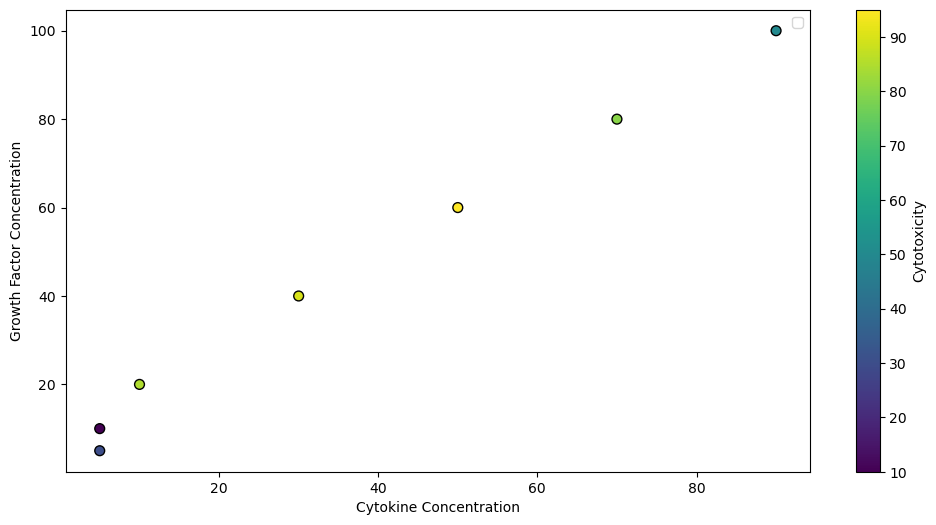

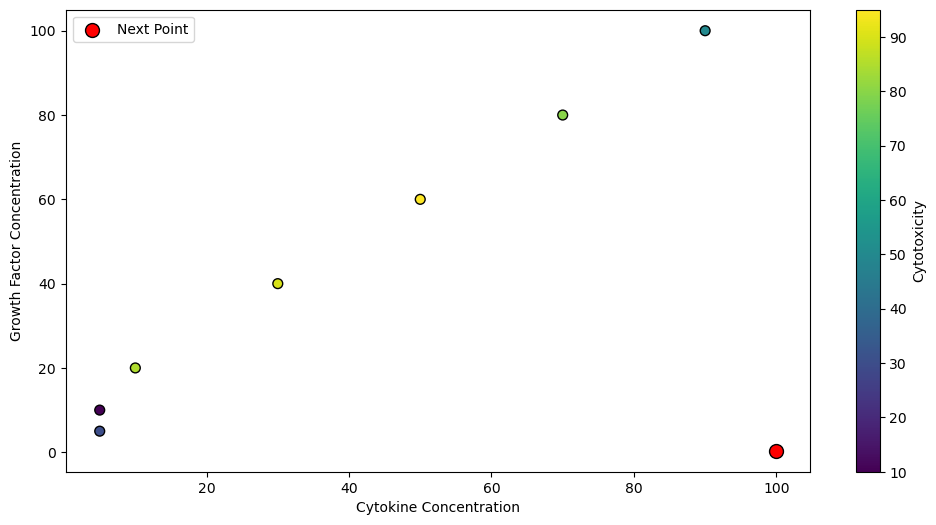

Next point to test: Cytokine Concentration = 99.95851658616934, Growth Factor Concentration = 0.3625787531111091
Predicted Cytotoxicity: 16517.22616007887
Actual Cytotoxicity: 85


In [44]:
import numpy as np
import matplotlib.pyplot as plt
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'cytokine_concentration': 10, 'growth_factor_concentration': 20, 'cytotoxicity': 85},
    {'cytokine_concentration': 30, 'growth_factor_concentration': 40, 'cytotoxicity': 90},
    {'cytokine_concentration': 50, 'growth_factor_concentration': 60, 'cytotoxicity': 95},
    {'cytokine_concentration': 70, 'growth_factor_concentration': 80, 'cytotoxicity': 80},
    {'cytokine_concentration': 90, 'growth_factor_concentration': 100, 'cytotoxicity': 50},
    {'cytokine_concentration': 5, 'growth_factor_concentration': 10, 'cytotoxicity': 10},
    {'cytokine_concentration': 5, 'growth_factor_concentration': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['cytokine_concentration'], dp['growth_factor_concentration']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Polynomial regression
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Objective function based on the fitted model
def nk_cell_cytotoxicity(cytokine_concentration, growth_factor_concentration):
    X_new = poly.transform([[cytokine_concentration, growth_factor_concentration]])
    cytotoxicity = model.predict(X_new)[0]
    return cytotoxicity

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'cytokine_concentration': (0, 100),
    'growth_factor_concentration': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=nk_cell_cytotoxicity,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=15,  # Initial random points
    n_iter=15  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Visualization
def plot_gp(gp, X, y, X_next=None, show_legend=True):
    plt.figure(figsize=(12, 6))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', zorder=10, edgecolors=(0, 0, 0))
    plt.colorbar(label='Cytotoxicity')
    plt.xlabel('Cytokine Concentration')
    plt.ylabel('Growth Factor Concentration')
    
    if X_next is not None:
        plt.scatter(X_next[0], X_next[1], c='red', s=100, zorder=20, edgecolors=(0, 0, 0), label='Next Point')
    
    if show_legend:
        plt.legend()
    plt.show()

# Plot initial data
plot_gp(gp, X, y)

# Plot after optimization
X_next = np.array([optimizer.max['params']['cytokine_concentration'], optimizer.max['params']['growth_factor_concentration']])
plot_gp(gp, X, y, X_next=X_next)

# Test the next point
next_cytokine_concentration = optimizer.max['params']['cytokine_concentration']
next_growth_factor_concentration = optimizer.max['params']['growth_factor_concentration']
predicted_cytotoxicity = nk_cell_cytotoxicity(next_cytokine_concentration, next_growth_factor_concentration)

print(f"Next point to test: Cytokine Concentration = {next_cytokine_concentration}, Growth Factor Concentration = {next_growth_factor_concentration}")
print(f"Predicted Cytotoxicity: {predicted_cytotoxicity}")

# Conduct the experiment at the next point and measure actual cytotoxicity
# Replace this with actual experimental measurement
actual_cytotoxicity = 85  # Example value

print(f"Actual Cytotoxicity: {actual_cytotoxicity}")


|   iter    |  target   | metabo... | metabo... | metabo... |
-------------------------------------------------------------
| 1         | 69.65     | 69.65     | 28.61     | 22.69     |
| 2         | 28.61     | 55.13     | 71.95     | 42.31     |
| 3         | 22.69     | 98.08     | 68.48     | 48.09     |
| 4         | 55.13     | 39.21     | 34.32     | 72.9      |
| 5         | 71.95     | 43.86     | 5.968     | 39.8      |
| 6         | 42.31     | 45.0      | 2.696     | 38.82     |
| 7         | 98.08     | 71.78     | 53.53     | 41.23     |
| 8         | 68.48     | 36.44     | 21.05     | 35.66     |
| 9         | 48.09     | 12.69     | 59.81     | 34.97     |
| 10        | 39.21     | 20.44     | 59.5      | 66.39     |
| 11        | 34.32     | 98.55     | 47.45     | 15.69     |
| 12        | 72.9      | 96.77     | 48.86     | 31.26     |
| 13        | 43.86     | 65.45     | 69.1      | 65.11     |
| 14        | 5.968     | 3.255     | 89.67     | 6.856     |
| 15    

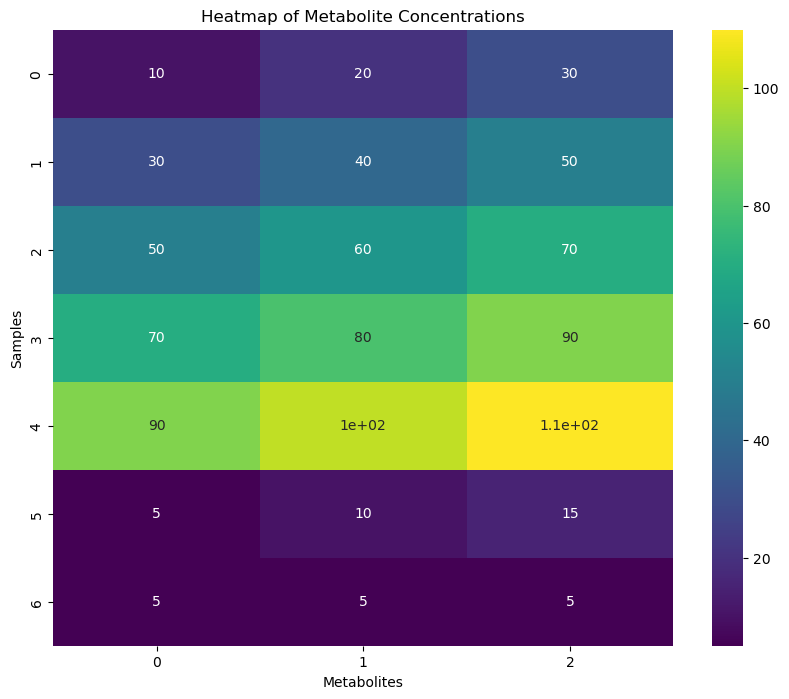

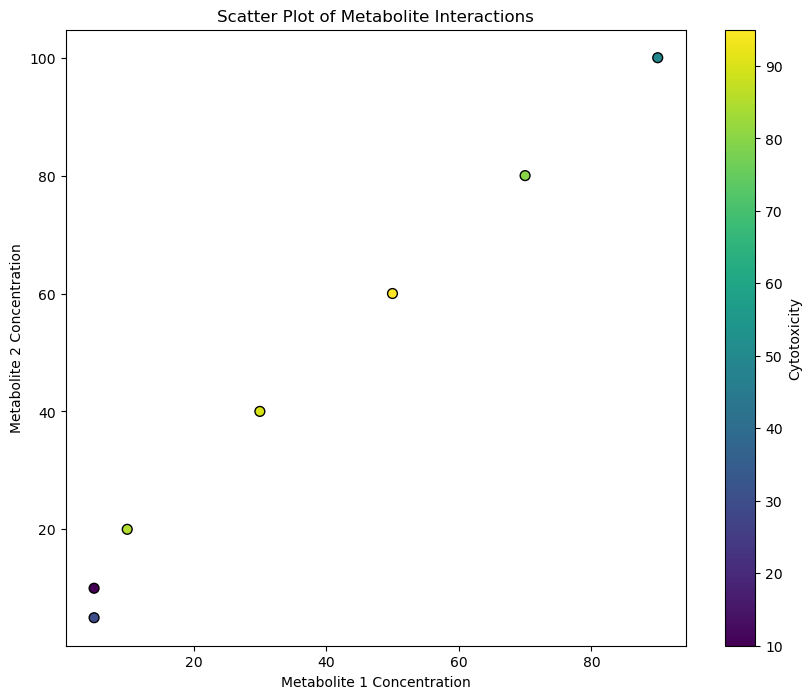

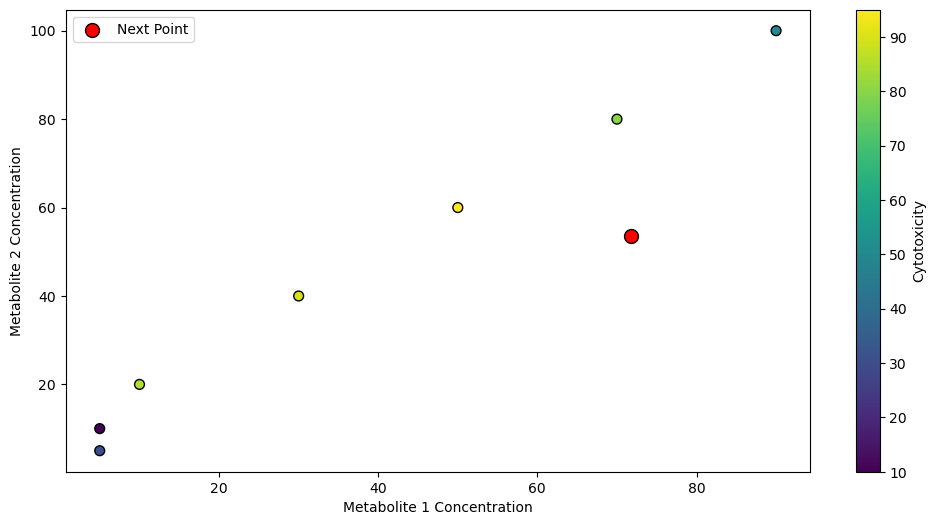

Next point to test: Metabolite 1 = 71.78304801342009, Metabolite 2 = 53.53307629086381, Metabolite 3 = 41.225396218089664
Predicted Cytotoxicity: 73.79954057320357
Actual Cytotoxicity: 85
|   iter    |  target   | metabo... | metabo... | metabo... |
-------------------------------------------------------------
| 1         | 42.64     | 69.65     | 28.61     | 22.69     |
| 2         | 89.34     | 55.13     | 71.95     | 42.31     |
| 3         | 94.42     | 98.08     | 68.48     | 48.09     |
| 4         | 50.18     | 39.21     | 34.32     | 72.9      |
| 5         | 62.4      | 43.86     | 5.968     | 39.8      |
| 6         | 11.56     | 97.13     | 69.25     | 45.11     |
| 7         | 31.73     | 71.78     | 53.53     | 41.23     |
| 8         | 41.48     | 36.44     | 21.05     | 35.66     |
| 9         | 86.63     | 12.69     | 59.81     | 34.97     |
| 10        | 25.05     | 20.44     | 59.5      | 66.39     |
| 11        | 48.3      | 98.55     | 47.45     | 15.69     |
| 12  

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 14        | 61.29     | 3.255     | 89.67     | 6.856     |
| 15        | 12.06     | 29.46     | 77.25     | 48.07     |
{'target': np.float64(98.5559785610705), 'params': {'metabolite1': np.float64(96.77392691761078), 'metabolite2': np.float64(48.863971452681696), 'metabolite3': np.float64(31.255185714000213)}}


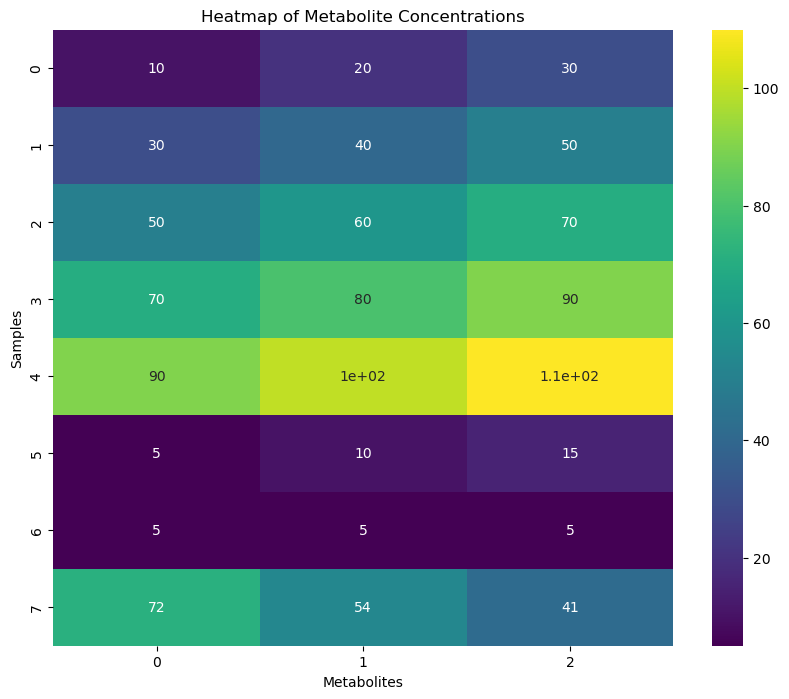

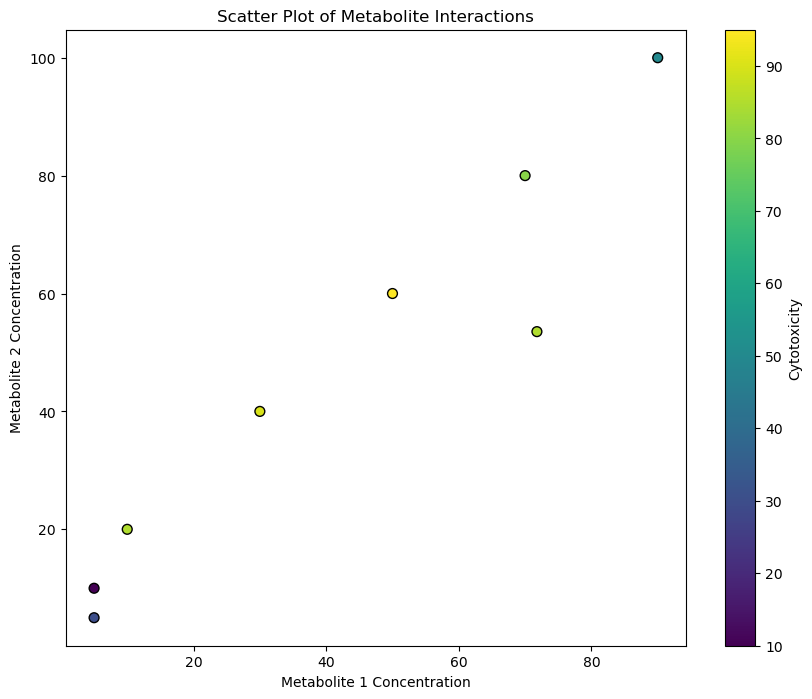

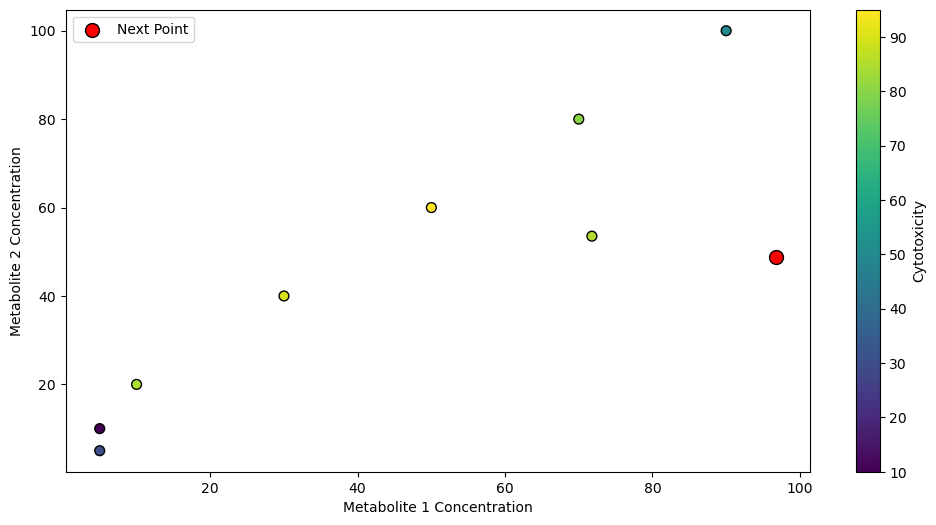

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from bayes_opt import BayesianOptimization
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the objective function based on the initial data
def objective_function(metabolite1, metabolite2, metabolite3):
    # Example function, replace with actual model
    return np.random.rand() * 100  # Placeholder for actual cytotoxicity measurement

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=pbounds,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=10  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Visualization functions
def plot_heatmap(X):
    plt.figure(figsize=(10, 8))
    sns.heatmap(X, annot=True, cmap='viridis')
    plt.title('Heatmap of Metabolite Concentrations')
    plt.xlabel('Metabolites')
    plt.ylabel('Samples')
    plt.show()

def plot_scatter(X, y):
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', edgecolors=(0, 0, 0))
    plt.colorbar(label='Cytotoxicity')
    plt.xlabel('Metabolite 1 Concentration')
    plt.ylabel('Metabolite 2 Concentration')
    plt.title('Scatter Plot of Metabolite Interactions')
    plt.show()

def plot_gp(gp, X, y, X_next=None, show_legend=True):
    plt.figure(figsize=(12, 6))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', zorder=10, edgecolors=(0, 0, 0))
    plt.colorbar(label='Cytotoxicity')
    plt.xlabel('Metabolite 1 Concentration')
    plt.ylabel('Metabolite 2 Concentration')
    
    if X_next is not None:
        plt.scatter(X_next[0], X_next[1], c='red', s=100, zorder=20, edgecolors=(0, 0, 0), label='Next Point')
    
    if show_legend:
        plt.legend()
    plt.show()

# Plot initial data
plot_heatmap(X)
plot_scatter(X, y)

# Plot after optimization
X_next = np.array([optimizer.max['params']['metabolite1'], optimizer.max['params']['metabolite2'], optimizer.max['params']['metabolite3']])
plot_gp(gp, X[:, :2], y, X_next=X_next[:2])

# Test the next point
next_metabolite1 = optimizer.max['params']['metabolite1']
next_metabolite2 = optimizer.max['params']['metabolite2']
next_metabolite3 = optimizer.max['params']['metabolite3']
predicted_cytotoxicity = objective_function(next_metabolite1, next_metabolite2, next_metabolite3)

print(f"Next point to test: Metabolite 1 = {next_metabolite1}, Metabolite 2 = {next_metabolite2}, Metabolite 3 = {next_metabolite3}")
print(f"Predicted Cytotoxicity: {predicted_cytotoxicity}")

# Conduct the experiment at the next point and measure actual cytotoxicity
# Replace this with actual experimental measurement
actual_cytotoxicity = 85  # Example value

print(f"Actual Cytotoxicity: {actual_cytotoxicity}")

# Add the new data point to the dataset
new_data_point = {'metabolite1': next_metabolite1, 'metabolite2': next_metabolite2, 'metabolite3': next_metabolite3, 'cytotoxicity': actual_cytotoxicity}
data_points.append(new_data_point)

# Extracting updated data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Refit the Gaussian Process model
gp.fit(X, y)

# Run the optimization again with the updated model
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=pbounds,
    random_state=123
)

optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=10  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Visualization after updating the model
plot_heatmap(X)
plot_scatter(X, y)
X_next = np.array([optimizer.max['params']['metabolite1'], optimizer.max['params']['metabolite2'], optimizer.max['params']['metabolite3']])
plot_gp(gp, X[:, :2], y, X_next=X_next[:2])



|   iter    |  target   | metabo... | metabo... | metabo... |
-------------------------------------------------------------
| 1         | 69.65     | 69.65     | 28.61     | 22.69     |
| 2         | 28.61     | 55.13     | 71.95     | 42.31     |
| 3         | 22.69     | 98.08     | 68.48     | 48.09     |
| 4         | 55.13     | 39.21     | 34.32     | 72.9      |
| 5         | 71.95     | 43.86     | 5.968     | 39.8      |
| 6         | 42.31     | 41.96     | 5.354     | 34.83     |
| 7         | 98.08     | 68.01     | 28.13     | 23.02     |
| 8         | 68.48     | 68.84     | 28.06     | 26.3      |
| 9         | 48.09     | 68.97     | 25.71     | 22.41     |
| 10        | 39.21     | 68.64     | 30.12     | 21.53     |
| 11        | 34.32     | 41.88     | 5.104     | 41.71     |
| 12        | 72.9      | 65.56     | 27.63     | 22.03     |
| 13        | 43.86     | 70.22     | 29.4      | 24.66     |
| 14        | 5.968     | 43.89     | 9.495     | 40.87     |
| 15    

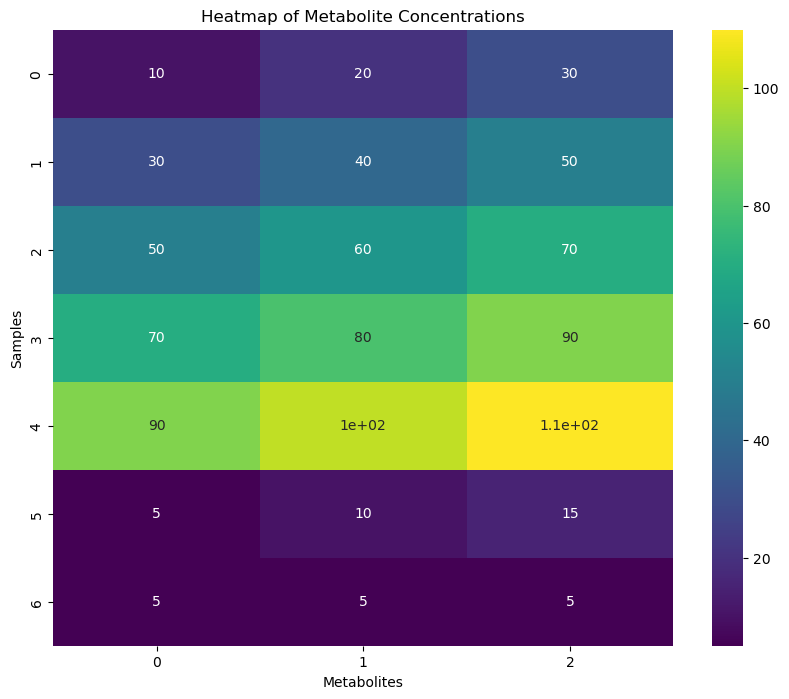

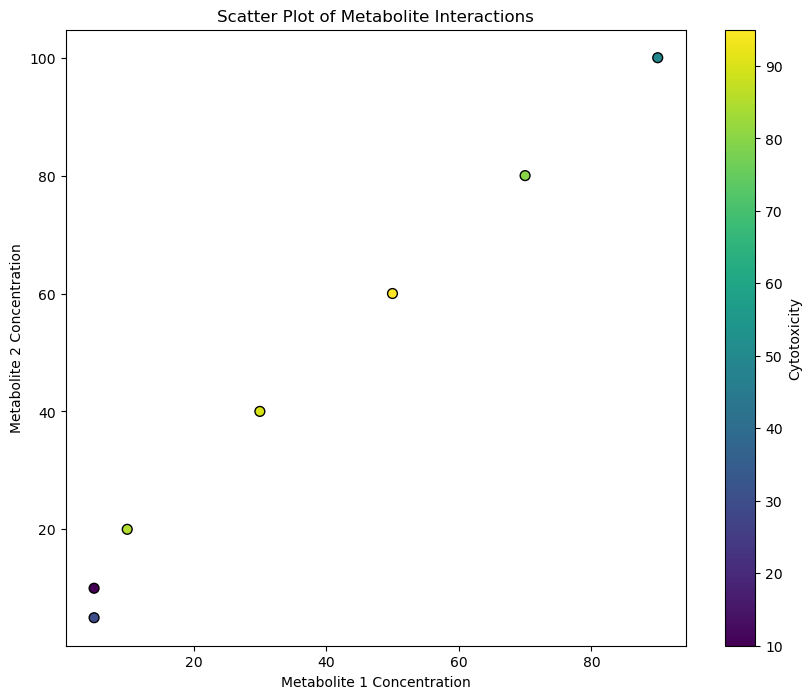

NameError: name 'utility_function' is not defined

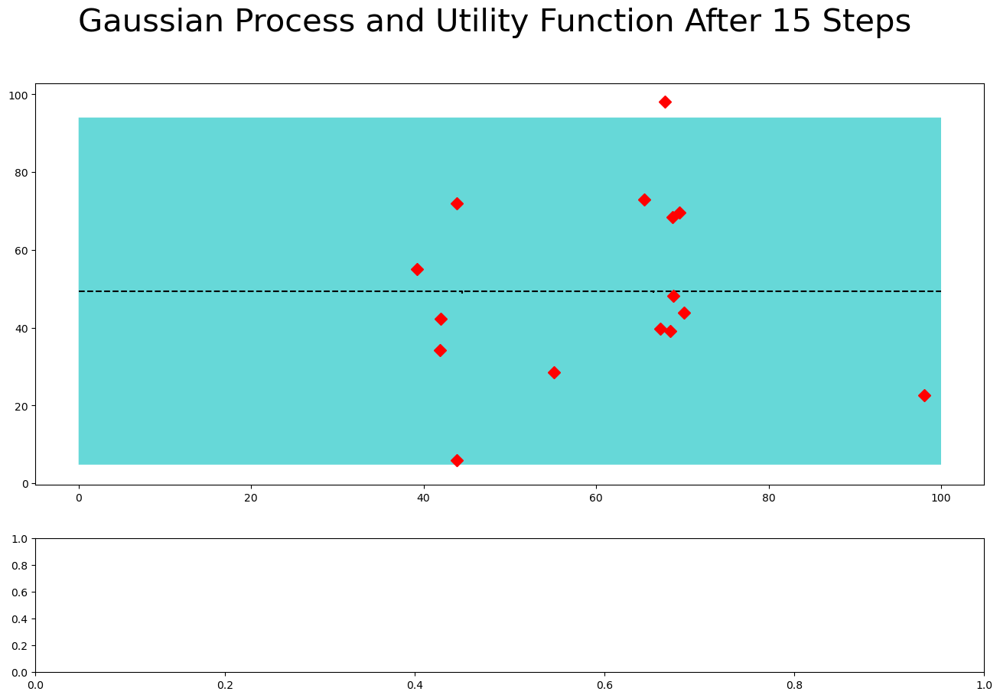

In [58]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from bayes_opt import BayesianOptimization
from bayes_opt import acquisition
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed
import matplotlib.gridspec as gridspec

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the objective function based on the initial data
def objective_function(metabolite1, metabolite2, metabolite3):
    # Example function, replace with actual model
    return np.random.rand() * 100  # Placeholder for actual cytotoxicity measurement

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
acquisition_function = acquisition.UpperConfidenceBound(kappa=5)
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=pbounds,
    acquisition_function=acquisition_function,
    random_state=123
)

# Run the optimization
optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=10  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Visualization functions
def plot_heatmap(X):
    plt.figure(figsize=(10, 8))
    sns.heatmap(X, annot=True, cmap='viridis')
    plt.title('Heatmap of Metabolite Concentrations')
    plt.xlabel('Metabolites')
    plt.ylabel('Samples')
    plt.show()

def plot_scatter(X, y):
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', edgecolors=(0, 0, 0))
    plt.colorbar(label='Cytotoxicity')
    plt.xlabel('Metabolite 1 Concentration')
    plt.ylabel('Metabolite 2 Concentration')
    plt.title('Scatter Plot of Metabolite Interactions')
    plt.show()

def posterior(optimizer, grid):
    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, y):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontsize=30
    )

    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])

    x_obs = np.array([[res["params"]["metabolite1"], res["params"]["metabolite2"], res["params"]["metabolite3"]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])

    optimizer.acquisition_function._fit_gp(optimizer._gp, optimizer._space)
    mu, sigma = posterior(optimizer, x)

    axis.plot(x[:, 0], mu, '--', color='k', label='Prediction')
    axis.plot(x_obs[:, 0], y_obs, 'D', markersize=8, label=u'Observations', color='r')

    axis.fill(np.concatenate([x[:, 0], x[:, 0][::-1]]),
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')

    utility = utility_function.utility(x, optimizer._gp, optimizer._space.target)
    x = x[:, 0]

    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15,
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim((0, 100))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('Metabolite 1 Concentration', fontdict={'size':20})

    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

# Plot initial data
plot_heatmap(X)
plot_scatter(X, y)

# Create a grid for plotting
grid = np.array([[i, j, k] for i in np.linspace(0, 100, 10) for j in np.linspace(0, 100, 10) for k in np.linspace(0, 100, 10)])

# Plot Gaussian Process and Utility Function
plot_gp(optimizer, grid, y)

# Test the next point
next_metabolite1 = optimizer.max['params']['metabolite1']
nextite2 = optimizer.max['params']['metabolite2']
next_metabolite3 = optimizer.max['params']['metabolite3']
predicted_cytotoxicity = objective_function(next_metabolite1, next_metabolite2, next_metabolite3)

print(f"Next point to test: Metabolite 1 = {next_metabolite1}, Metabolite 2 = {next_metabolite2}, Metabolite 3 = {next_metabolite3}")
print(f"Predicted Cytotoxicity: {predicted_cytotoxicity}")

# Conduct the experiment at the next point and measure actual cytotoxicity
# Replace this with actual experimental measurement
actual_cytotoxicity = 85  # Example value

print(f"Actual Cytotoxicity: {actual_cytotoxicity}")

# Add the new data point to the dataset
new_data_point = {'metabolite1': next_metabolite1, 'metabolite2': next_metabolite2, 'metabolite3': next_metabolite3, 'cytotoxicity': actual_cytotoxicity}
data_points.append(new_data_point)

# Extracting updated data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Refit the Gaussian Process model
gp.fit(X, y)

# Run the optimization again with the updated model
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=pbounds,
    random_state=123
)

optimizer.maximize(
    init_points=5,  # Initial random points
    n_iter=10  # Number of iterations
)

# Print the best result
print(optimizer.max)

# Visualization after updating the model
plot_heatmap(X)
plot_scatter(X, y)
plot_gp(optimizer, grid, y)


Writing the objective as a Gaussian

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\2610644213.py:56: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


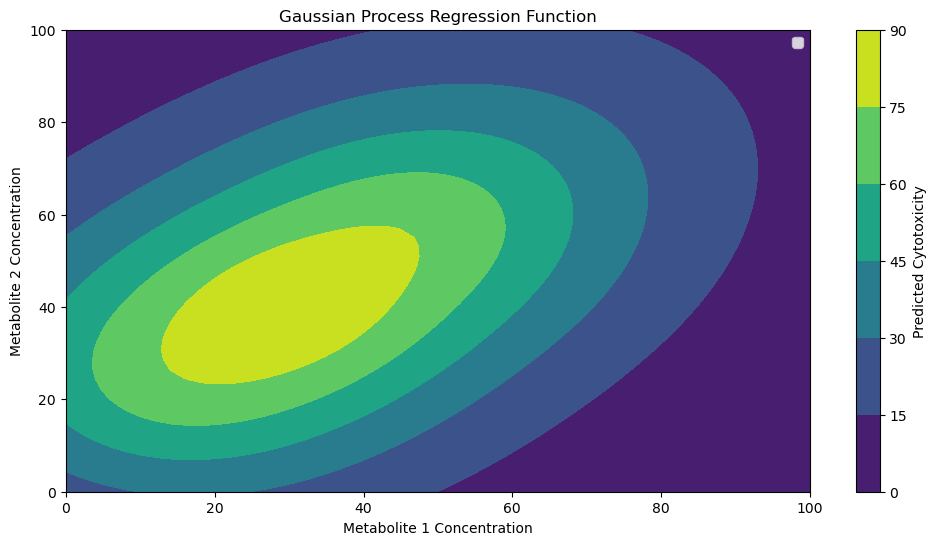

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Generate a grid of points to evaluate the GPR function
grid_size = 50
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x1_grid, x2_grid = np.meshgrid(x1, x2)
x3_fixed = np.mean([dp['metabolite3'] for dp in data_points]) # Fix metabolite3 at its mean value

# Predict cytotoxicity using the GPR model for each point in the grid
X_grid = np.array([[x1_grid[i,j], x2_grid[i,j], x3_fixed] for i in range(grid_size) for j in range(grid_size)])
y_pred_grid = gp.predict(X_grid).reshape(grid_size, grid_size)

# Plot the GPR function
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_grid, cmap='viridis')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Gaussian Process Regression Function')
# plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
plt.legend()
plt.show()


Mean Squared Error (GPR): 1.1671108199390292e-22
Mean Squared Error (Random Forest): 144.51178571428574


c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


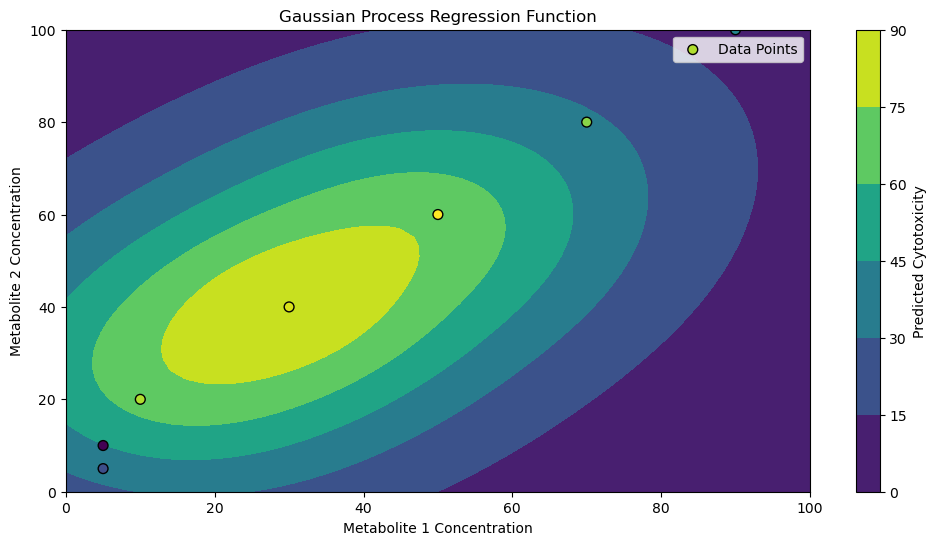

Text(0.5, 1.0, 'Random Forest')

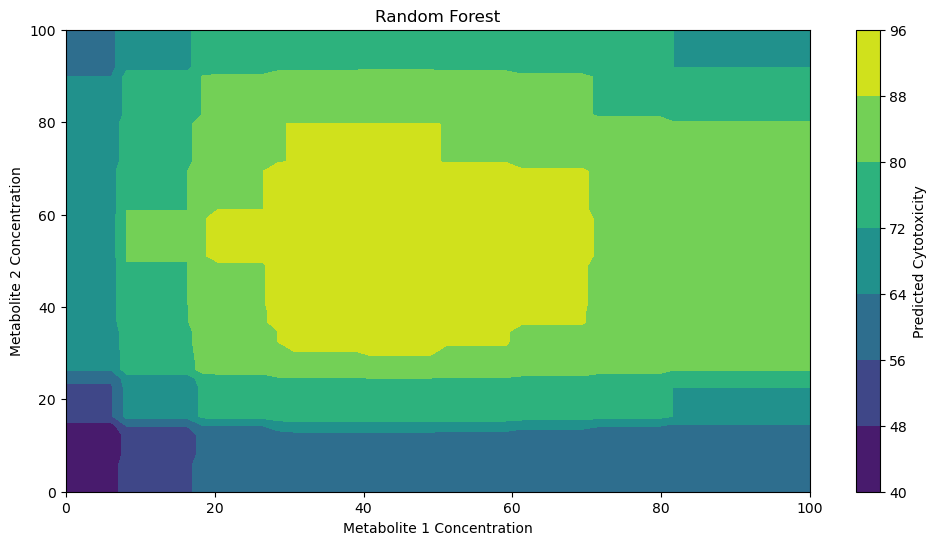

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Initialize the Random Forest model
rf = RandomForestRegressor(n_estimators=100)

# Fit the Random Forest model to the initial data
rf.fit(X, y)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Generate a grid of points to evaluate the models
grid_size = 50
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x1_grid, x2_grid = np.meshgrid(x1, x2)
x3_fixed = np.mean([dp['metabolite3'] for dp in data_points]) # Fix metabolite3 at its mean value

# Predict cytotoxicity using the GPR model for each point in the grid
X_grid = np.array([[x1_grid[i,j], x2_grid[i,j], x3_fixed] for i in range(grid_size) for j in range(grid_size)])
y_pred_gp = gp.predict(X_grid).reshape(grid_size, grid_size)

# Predict cytotoxicity using the Random Forest model for each point in the grid
y_pred_rf = rf.predict(X_grid).reshape(grid_size, grid_size)

# Calculate mean squared error for both models on the initial data
mse_gp = mean_squared_error(y, gp.predict(X))
mse_rf = mean_squared_error(y, rf.predict(X))

print(f"Mean Squared Error (GPR): {mse_gp}")
print(f"Mean Squared Error (Random Forest): {mse_rf}")

# Plot the GPR function
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_gp, cmap='viridis')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Gaussian Process Regression Function')
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
plt.legend()
plt.show()

# Plot the Random Forest function
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_rf, cmap='viridis')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Random Forest')

3D

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


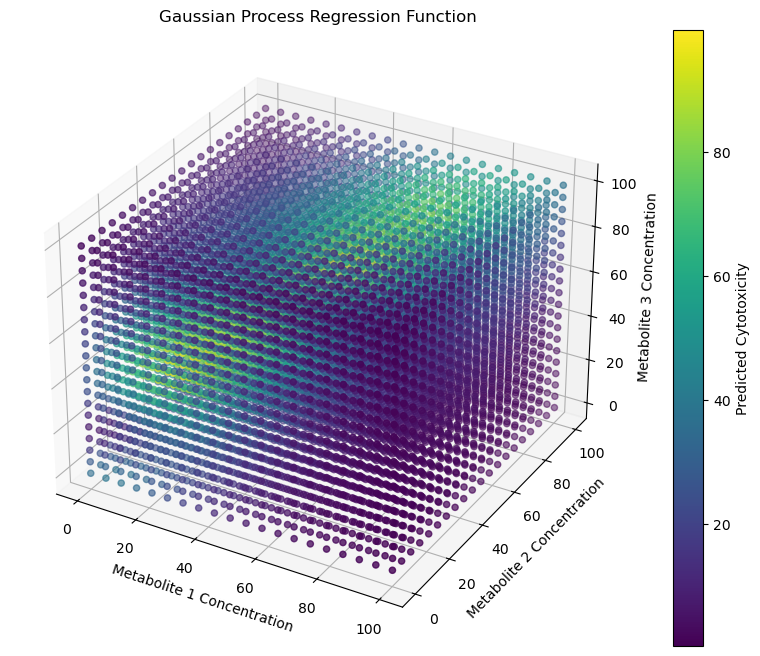

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Generate a grid of points to evaluate the GPR function
grid_size = 20
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x3 = np.linspace(pbounds['metabolite3'][0], pbounds['metabolite3'][1], grid_size)
x1_grid, x2_grid, x3_grid = np.meshgrid(x1, x2, x3)

# Predict cytotoxicity using the GPR model for each point in the grid
X_grid = np.array([[x1_grid[i,j,k], x2_grid[i,j,k], x3_grid[i,j,k]] for i in range(grid_size) for j in range(grid_size) for k in range(grid_size)])
y_pred_grid = gp.predict(X_grid).reshape(grid_size, grid_size, grid_size)

# Plot the GPR function in 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scat = ax.scatter(x1_grid.flatten(), x2_grid.flatten(), x3_grid.flatten(), c=y_pred_grid.flatten(), cmap='viridis')
fig.colorbar(scat, label='Predicted Cytotoxicity')
ax.set_xlabel('Metabolite 1 Concentration')
ax.set_ylabel('Metabolite 2 Concentration')
ax.set_zlabel('Metabolite 3 Concentration')
ax.set_title('Gaussian Process Regression Function')
plt.show()


Updated to use Gaussian

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


|   iter    |  target   | metabo... | metabo... | metabo... |
-------------------------------------------------------------
| 1         | 10.07     | 69.65     | 28.61     | 22.69     |
| 2         | 34.35     | 55.13     | 71.95     | 42.31     |
| 3         | 9.362     | 98.08     | 68.48     | 48.09     |
| 4         | 53.72     | 39.21     | 34.32     | 72.9      |
| 5         | 27.29     | 43.86     | 5.968     | 39.8      |
| 6         | 56.18     | 39.81     | 33.06     | 69.76     |
| 7         | 72.22     | 17.53     | 41.71     | 56.06     |
| 8         | 17.24     | 1.085     | 69.5      | 41.97     |
| 9         | 43.06     | 9.497     | 22.49     | 64.08     |
| 10        | 80.41     | 30.83     | 49.84     | 58.3      |
| 11        | 47.06     | 26.1      | 65.49     | 75.26     |
| 12        | 85.4      | 31.72     | 42.64     | 44.75     |
| 13        | 18.43     | 0.4791    | 21.16     | 1.013     |
| 14        | 0.9804    | 98.4      | 1.592     | 97.62     |
| 15    

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


| 7         | 73.84     | 17.53     | 41.71     | 56.06     |
| 8         | 18.51     | 1.085     | 69.5      | 41.97     |
| 9         | 45.58     | 9.497     | 22.49     | 64.08     |
| 10        | 81.03     | 30.83     | 49.84     | 58.3      |
| 11        | 35.78     | 18.86     | 60.34     | 79.3      |
| 12        | 85.0      | 31.72     | 42.64     | 44.75     |
| 13        | 18.83     | 0.4791    | 21.16     | 1.013     |
| 14        | 1.169     | 98.4      | 1.592     | 97.62     |
| 15        | 51.76     | 70.87     | 99.42     | 98.63     |
Iteration 2: Best result: {'target': np.float64(85.00000000000057), 'params': {'metabolite1': np.float64(31.718875875609275), 'metabolite2': np.float64(42.64122356738353), 'metabolite3': np.float64(44.746244027126956)}}
Next point to test: Metabolite 1 = 31.718875875609275, Metabolite 2 = 42.64122356738353, Metabolite 3 = 44.746244027126956
Predicted Cytotoxicity: 85.00000000000057
Actual Cytotoxicity: 85


c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


|   iter    |  target   | metabo... | metabo... | metabo... |
-------------------------------------------------------------
| 1         | 10.89     | 69.65     | 28.61     | 22.69     |
| 2         | 35.64     | 55.13     | 71.95     | 42.31     |
| 3         | 10.27     | 98.08     | 68.48     | 48.09     |
| 4         | 55.63     | 39.21     | 34.32     | 72.9      |
| 5         | 28.94     | 43.86     | 5.968     | 39.8      |
| 6         | 58.03     | 39.81     | 33.06     | 69.76     |
| 7         | 73.84     | 17.53     | 41.71     | 56.06     |
| 8         | 18.51     | 1.085     | 69.5      | 41.97     |
| 9         | 45.58     | 9.497     | 22.49     | 64.08     |
| 10        | 81.03     | 30.83     | 49.84     | 58.3      |
| 11        | 35.78     | 18.86     | 60.34     | 79.3      |
| 12        | 85.0      | 31.72     | 42.64     | 44.75     |
| 13        | 18.83     | 0.4791    | 21.16     | 1.013     |
| 14        | 1.169     | 98.4      | 1.592     | 97.62     |
| 15    

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


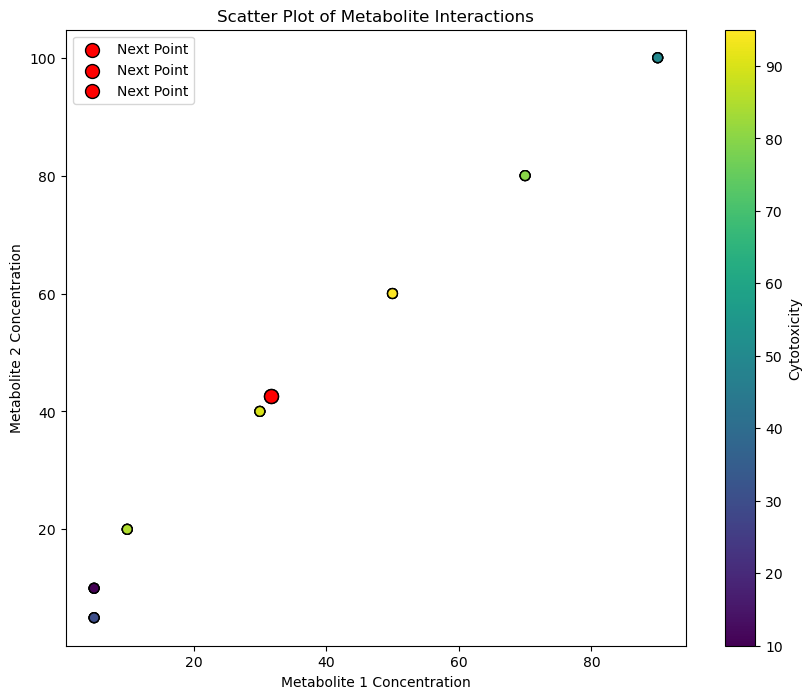

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from bayes_opt import BayesianOptimization
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from numpy.random import seed

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]


# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Define the objective function using the Gaussian Process model
def objective_function(metabolite1, metabolite2, metabolite3):
    return gp.predict([[metabolite1, metabolite2, metabolite3]])[0]


# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Initialize Bayesian Optimization
seed(123)
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=pbounds,
    random_state=123
)

# Visualization functions
def plot_heatmap(X):
    plt.figure(figsize=(10, 8))
    sns.heatmap(X, annot=True, cmap='viridis')
    plt.title('Heatmap of Metabolite Concentrations')
    plt.xlabel('Metabolites')
    plt.ylabel('Samples')
    plt.show()

def plot_scatter(X, y):
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', edgecolors=(0, 0, 0))
    plt.colorbar(label='Cytotoxicity')
    plt.xlabel('Metabolite 1 Concentration')
    plt.ylabel('Metabolite 2 Concentration')
    plt.title('Scatter Plot of Metabolite Interactions')
    plt.show()

def update_scatter(ax, X, y):
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', edgecolors=(0, 0, 0))
    ax.figure.canvas.draw()

def update_heatmap(ax, X):
    sns.heatmap(X, annot=True, cmap='viridis', ax=ax)
    ax.figure.canvas.draw()

# Number of iterations
num_iterations = 3

# Initial plots


fig_scatter, ax_scatter = plt.subplots(figsize=(10, 8))
ax_scatter.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis', edgecolors=(0, 0, 0))
ax_scatter.set_title('Scatter Plot of Metabolite Interactions')
ax_scatter.set_xlabel('Metabolite 1 Concentration')
ax_scatter.set_ylabel('Metabolite 2 Concentration')
fig_scatter.colorbar(ax_scatter.collections[0], label='Cytotoxicity')

for i in range(num_iterations):
    # Run the optimization
    optimizer.maximize(
        init_points=5,  # Initial random points
        n_iter=10  # Number of iterations
    )

    # Check if optimizer.max is not None
    if optimizer.max is not None:
        # Print the best result
        print(f"Iteration {i+1}: Best result: {optimizer.max}")

        # Test the next point
        next_metabolite1 = optimizer.max['params']['metabolite1']
        next_metabolite2 = optimizer.max['params']['metabolite2']
        next_metabolite3 = optimizer.max['params']['metabolite3']
        predicted_cytotoxicity = objective_function(next_metabolite1, next_metabolite2, next_metabolite3)

        print(f"Next point to test: Metabolite 1 = {next_metabolite1}, Metabolite 2 = {next_metabolite2}, Metabolite 3 = {next_metabolite3}")
        print(f"Predicted Cytotoxicity: {predicted_cytotoxicity}")

        # Conduct the experiment at the next point and measure actual cytotoxicity
        # Replace this with actual experimental measurement
        actual_cytotoxicity = 85  # Example value

        print(f"Actual Cytotoxicity: {actual_cytotoxicity}")

        # Add the new data point to the dataset
        new_data_point = {'metabolite1': next_metabolite1, 'metabolite2': next_metabolite2, 'metabolite3': next_metabolite3, 'cytotoxicity': actual_cytotoxicity}
        data_points.append(new_data_point)

        # Extracting updated data
        X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
        y = np.array([dp['cytotoxicity'] for dp in data_points])

        # Refit the Gaussian Process model
        gp.fit(X, y)

        # Reinitialize Bayesian Optimization with updated data
        optimizer = BayesianOptimization(
            f=objective_function,
            pbounds=pbounds,
            random_state=123
        )

        # Update the plots with new data points
        
        update_scatter(ax_scatter, X, y)
        ax_scatter.scatter(next_metabolite1, next_metabolite2, c='red', s=100, zorder=20, edgecolors=(0, 0, 0), label='Next Point')
        ax_scatter.legend()
    else:
        print(f"Iteration {i+1}: No valid points found.")



Comparing regression models

Mean Squared Error (GPR): 1.168844691130939e-22
Mean Squared Error (Random Forest): 123.90357142857145
Mean Squared Error (Linear Regression): 379.1534971053043


c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


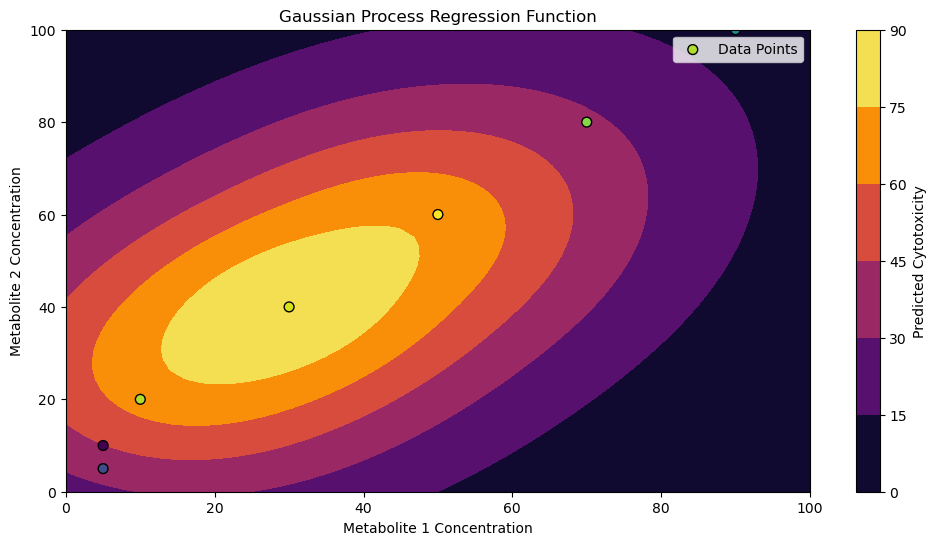

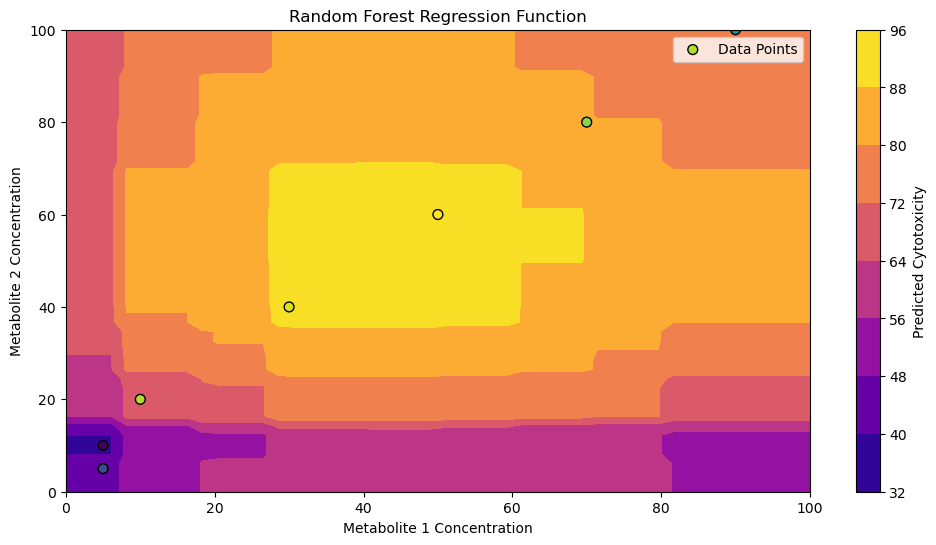

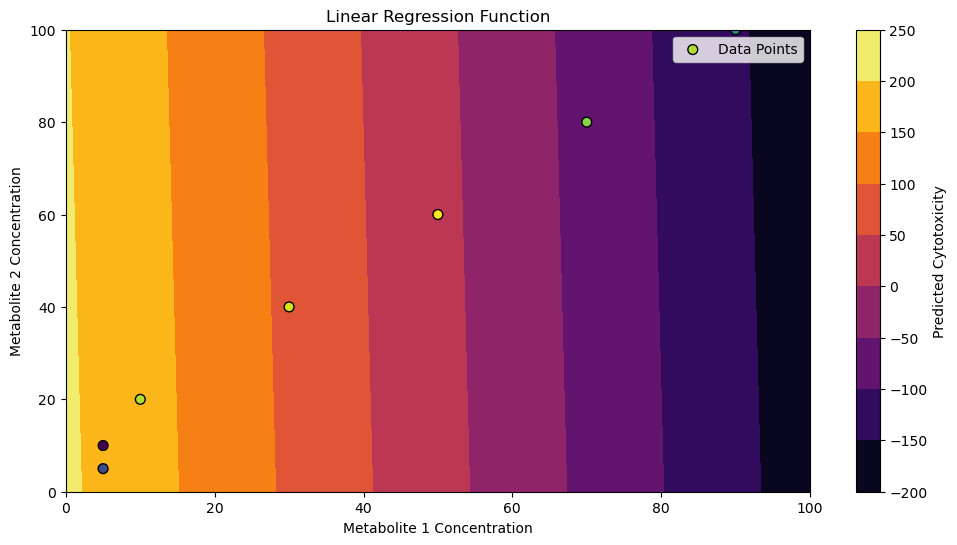

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Initialize the Random Forest model
rf = RandomForestRegressor(n_estimators=100)

# Fit the Random Forest model to the initial data
rf.fit(X, y)

# Initialize the Linear Regression model
lr = LinearRegression()

# Fit the Linear Regression model to the initial data
lr.fit(X, y)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Generate a grid of points to evaluate the models
grid_size = 50
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x1_grid, x2_grid = np.meshgrid(x1, x2)
x3_fixed = np.mean([dp['metabolite3'] for dp in data_points]) # Fix metabolite3 at its mean value

# Predict cytotoxicity using the GPR model for each point in the grid
X_grid = np.array([[x1_grid[i,j], x2_grid[i,j], x3_fixed] for i in range(grid_size) for j in range(grid_size)])
y_pred_gp = gp.predict(X_grid).reshape(grid_size, grid_size)

# Predict cytotoxicity using the Random Forest model for each point in the grid
y_pred_rf = rf.predict(X_grid).reshape(grid_size, grid_size)

# Predict cytotoxicity using the Linear Regression model for each point in the grid
y_pred_lr = lr.predict(X_grid).reshape(grid_size, grid_size)

# Calculate mean squared error for all models on the initial data
mse_gp = mean_squared_error(y, gp.predict(X))
mse_rf = mean_squared_error(y, rf.predict(X))
mse_lr = mean_squared_error(y, lr.predict(X))

print(f"Mean Squared Error (GPR): {mse_gp}")
print(f"Mean Squared Error (Random Forest): {mse_rf}")
print(f"Mean Squared Error (Linear Regression): {mse_lr}")

# Plot the GPR function in 2D contour plot
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_gp, cmap='inferno')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Gaussian Process Regression Function')
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
plt.legend()
plt.show()

# Plot the Random Forest function in 2D contour plot
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_rf, cmap='plasma')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Random Forest Regression Function')
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
plt.legend()
plt.show()

# Plot the Linear Regression function in 2D contour plot
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_lr, cmap='inferno')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration')
plt.ylabel('Metabolite 2 Concentration')
plt.title('Linear Regression Function')
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
plt.legend()
plt.show()


Kernels

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\srzima\Miniconda3\envs

Mean Squared Error (Matern): 1.1689655716682786e-22
Mean Squared Error (RBF): 4.8912697904280203e-23
Mean Squared Error (RationalQuadratic): 3.6082768271405157e-23
Mean Squared Error (ExpSineSquared): 2.106409717611776e-22
Mean Squared Error (DotProduct): 378.4761984688895


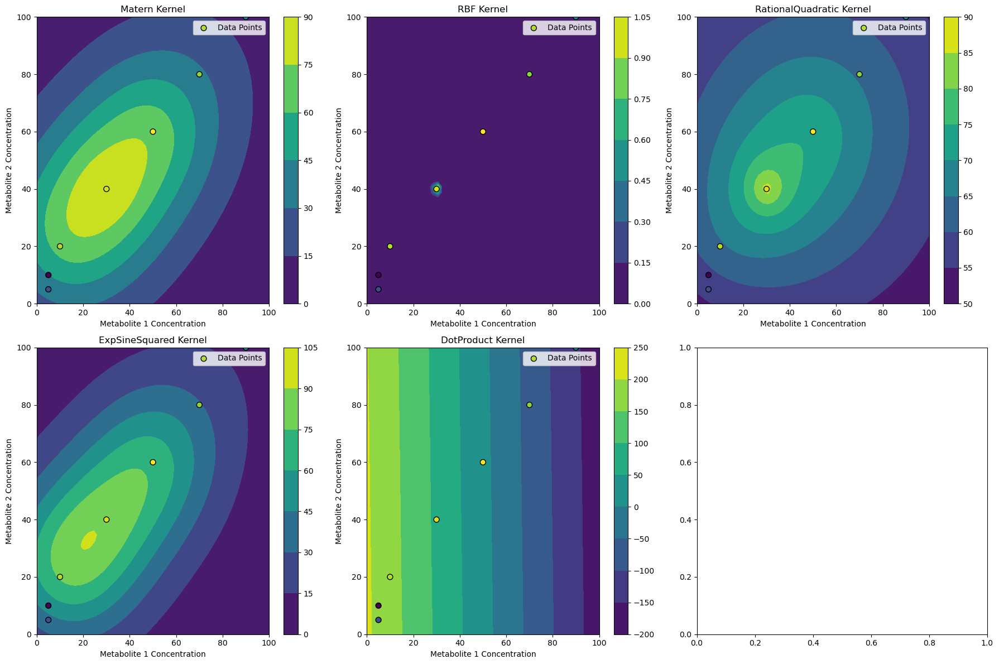

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, RBF, RationalQuadratic, ExpSineSquared, DotProduct, ConstantKernel as C
from sklearn.metrics import mean_squared_error

# Initial data points (replace with actual experimental data)
data_points = [
    {'metabolite1': 10, 'metabolite2': 20, 'metabolite3': 30, 'cytotoxicity': 85},
    {'metabolite1': 30, 'metabolite2': 40, 'metabolite3': 50, 'cytotoxicity': 90},
    {'metabolite1': 50, 'metabolite2': 60, 'metabolite3': 70, 'cytotoxicity': 95},
    {'metabolite1': 70, 'metabolite2': 80, 'metabolite3': 90, 'cytotoxicity': 80},
    {'metabolite1': 90, 'metabolite2': 100, 'metabolite3': 110, 'cytotoxicity': 50},
    {'metabolite1': 5, 'metabolite2': 10, 'metabolite3': 15, 'cytotoxicity': 10},
    {'metabolite1': 5, 'metabolite2': 5, 'metabolite3': 5, 'cytotoxicity': 30}
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define different kernels for comparison
kernels = {
    "Matern": C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5),
    "RBF": C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)),
    "RationalQuadratic": C(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.5),
    "ExpSineSquared": C(1.0, (1e-3, 1e3)) * ExpSineSquared(length_scale=1.0, periodicity=3.0),
    "DotProduct": C(1.0, (1e-3, 1e3)) * DotProduct(sigma_0=1.0)
}

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 100),
    'metabolite2': (0, 100),
    'metabolite3': (0, 100)
}

# Generate a grid of points to evaluate the models
grid_size = 50
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x1_grid, x2_grid = np.meshgrid(x1, x2)
x3_fixed = np.mean([dp['metabolite3'] for dp in data_points]) # Fix metabolite3 at its mean value

# Initialize a dictionary to store predictions and MSE for each kernel
predictions = {}
mse_values = {}

# Fit the Gaussian Process model with each kernel and make predictions
for kernel_name, kernel in kernels.items():
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    gp.fit(X, y)
    
    # Predict cytotoxicity using the GPR model for each point in the grid
    X_grid = np.array([[x1_grid[i,j], x2_grid[i,j], x3_fixed] for i in range(grid_size) for j in range(grid_size)])
    y_pred_grid = gp.predict(X_grid).reshape(grid_size, grid_size)
    
    # Store predictions and MSE values
    predictions[kernel_name] = y_pred_grid
    mse_values[kernel_name] = mean_squared_error(y, gp.predict(X))

# Print MSE values for each kernel
for kernel_name in kernels.keys():
    print(f"Mean Squared Error ({kernel_name}): {mse_values[kernel_name]}")

# Plot the predictions for each kernel in a separate subplot
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, (kernel_name, y_pred_grid) in enumerate(predictions.items()):
    ax = axes[i]
    contour = ax.contourf(x1_grid, x2_grid, y_pred_grid, cmap='viridis')
    fig.colorbar(contour, ax=ax)
    ax.set_xlabel('Metabolite 1 Concentration')
    ax.set_ylabel('Metabolite 2 Concentration')
    ax.set_title(f'{kernel_name} Kernel')
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors=(0, 0, 0), label='Data Points')
    ax.legend()

plt.tight_layout()
plt.show()


Categorical values

c:\Users\srzima\Miniconda3\envs\bayesian\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\srzima\AppData\Local\Temp\ipykernel_12336\2792106409.py:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


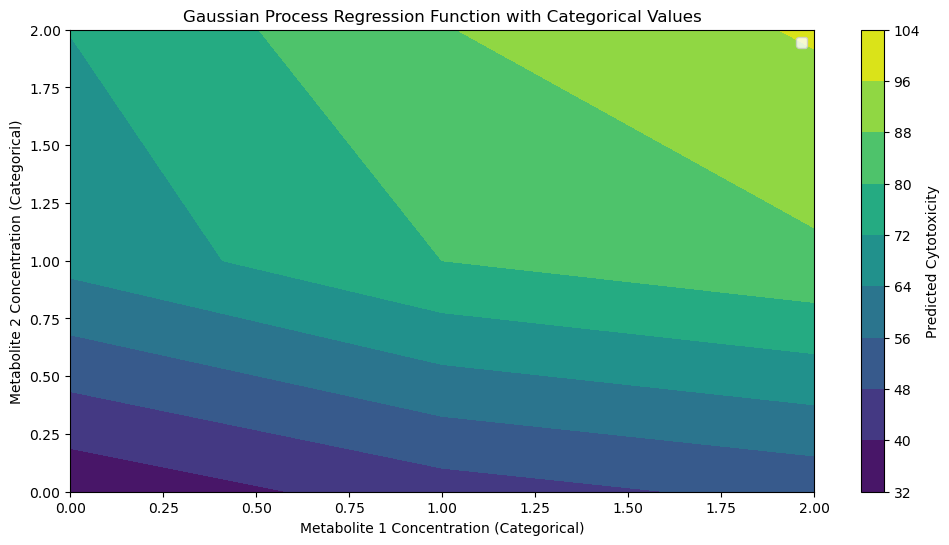

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Initial data points with categorical values
data_points = [
    {'metabolite1': 0, 'metabolite2': 1, 'metabolite3': 2, 'cytotoxicity': 85},  # low, medium, high
    {'metabolite1': 1, 'metabolite2': 2, 'metabolite3': 2, 'cytotoxicity': 90},  # medium, high, high
    {'metabolite1': 2, 'metabolite2': 2, 'metabolite3': 2, 'cytotoxicity': 95},  # high, high, high
    {'metabolite1': 2, 'metabolite2': 1, 'metabolite3': 0, 'cytotoxicity': 80},  # high, medium, low
    {'metabolite1': 2, 'metabolite2': 0, 'metabolite3': 1, 'cytotoxicity': 50},  # high, low, medium
    {'metabolite1': 0, 'metabolite2': 0, 'metabolite3': 0, 'cytotoxicity': 10},  # low, low, low
    {'metabolite1': 0, 'metabolite2': 0, 'metabolite3': 1, 'cytotoxicity': 30}   # low, low, medium
]

# Extracting data
X = np.array([[dp['metabolite1'], dp['metabolite2'], dp['metabolite3']] for dp in data_points])
y = np.array([dp['cytotoxicity'] for dp in data_points])

# Define the kernel function for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

# Initialize the Gaussian Process with the kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit the Gaussian Process model to the initial data
gp.fit(X, y)

# Define the bounds of the parameters
pbounds = {
    'metabolite1': (0, 2),
    'metabolite2': (0, 2),
    'metabolite3': (0, 2)
}

# Generate a grid of points to evaluate the GPR function
grid_size = 3  # Since we have 3 categories: low, medium, high
x1 = np.linspace(pbounds['metabolite1'][0], pbounds['metabolite1'][1], grid_size)
x2 = np.linspace(pbounds['metabolite2'][0], pbounds['metabolite2'][1], grid_size)
x1_grid, x2_grid = np.meshgrid(x1, x2)
x3_fixed = np.mean([dp['metabolite3'] for dp in data_points])  # Fix metabolite3 at its mean value

# Predict cytotoxicity using the GPR model for each point in the grid
X_grid = np.array([[x1_grid[i,j], x2_grid[i,j], x3_fixed] for i in range(grid_size) for j in range(grid_size)])
y_pred_grid = gp.predict(X_grid).reshape(grid_size, grid_size)

# Plot the GPR function
plt.figure(figsize=(12, 6))
plt.contourf(x1_grid, x2_grid, y_pred_grid, cmap='viridis')
plt.colorbar(label='Predicted Cytotoxicity')
plt.xlabel('Metabolite 1 Concentration (Categorical)')
plt.ylabel('Metabolite 2 Concentration (Categorical)')
plt.title('Gaussian Process Regression Function with Categorical Values')
plt.legend()
plt.show()
